**PROGETTO WIKIPEDIA**


Analisi ed Etichettatura Automatica Articoli Wikipedia
Framework: Databricks + PySpark

# 1 - Caricamento Dati e Librerie

In [0]:
%pip install wordcloud
%pip install nltk
%pip install --upgrade pip 
%pip install --upgrade Pillow

Python interpreter will be restarted.
  Using cached wordcloud-1.9.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (513 kB)
Python interpreter will be restarted.
Python interpreter will be restarted.
  Using cached nltk-3.9.1-py3-none-any.whl (1.5 MB)
  Using cached regex-2024.11.6-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (780 kB)
  Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
Python interpreter will be restarted.
Python interpreter will be restarted.
  Using cached pip-25.1.1-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 21.2.4
    Uninstalling pip-21.2.4:
      Successfully uninstalled pip-21.2.4
Python interpreter will be restarted.
Python interpreter will be restarted.
  Using cached pillow-11.3.0-cp39-cp39-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (9.0 kB)
Using cached pillow-11.3.0-cp39-cp39-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (6.6 MB)
  Attempting uninstall: Pillow
    Found e

In [0]:
from wordcloud import WordCloud
import pandas as pd
from pyspark.sql.functions import col, sum, when, length, avg, count, round, row_number 
import matplotlib.pyplot as plt
from pyspark.sql.window import Window
import nltk
nltk.download('stopwords')
import re
from nltk.corpus import stopwords
from wordcloud import WordCloud
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover
from pyspark.sql.functions import concat_ws
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF, StringIndexer
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder
from random import sample
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
import seaborn as sns

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
!wget https://proai-datasets.s3.eu-west-3.amazonaws.com/wikipedia.csv
dataset = pd.read_csv('/databricks/driver/wikipedia.csv')
spark_df = spark.createDataFrame(dataset)
spark_df = spark_df.drop("Unnamed: 0")
spark_df.write.mode("overwrite").saveAsTable("wikipedia")

--2025-07-03 10:40:46--  https://proai-datasets.s3.eu-west-3.amazonaws.com/wikipedia.csv
Resolving proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)... 52.95.154.98, 16.12.18.38
Connecting to proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)|52.95.154.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1003477941 (957M) [text/csv]
Saving to: ‘wikipedia.csv.1’

wikipedia.csv.1       8%[>                   ]  81.8

*** WARNING: max output size exceeded, skipping output. ***

wikipedia.csv.1     100%[===================>] 956.99M  2.12MB/s    in 7m 2s   

2025-07-03 10:47:49 (2.27 MB/s) - ‘wikipedia.csv.1’ saved [1003477941/1003477941]



In [0]:
wikipedia_df = spark.table("wikipedia")
n_rows = wikipedia_df.count()
n_cols = len(wikipedia_df.columns)
print(f"Il DataFrame ha {n_rows} righe e {n_cols} colonne.")
display(wikipedia_df.limit(5))

Il DataFrame ha 153232 righe e 4 colonne.


title summary documents categoria economics economics () is a social science that studies the production, distribution, and consumption of goods and services.economics focuses on the behaviour and interactions of economic agents and how economies work. microeconomics analyzes what's viewed as basic elements in the economy, including individual agents and markets, their interactions, and the outcomes of interactions. individual agents may include, for example, households, firms, buyers, and sellers. macroeconomics analyzes the economy as a system where production, consumption, saving, and investment interact, and factors affecting it: employment of the resources of labour, capital, and land, currency inflation, economic growth, and public policies that have impact on these elements. other broad distinctions within economics include those between positive economics, describing "what is", and normative economics, advocating "what ought to be"; between economic theory and applied economics; between rational and behavioural economics; and between mainstream economics and heterodox economics.economic analysis can be applied throughout society, including business, finance, cybersecurity, health care, engineering and government. it is also applied to such diverse subjects as crime, education, the family, feminism, law, philosophy, politics, religion, social institutions, war, science, and the environment. economics () is a social science that studies the production, distribution, and consumption of goods and services.economics focuses on the behaviour and interactions of economic agents and how economies work. microeconomics analyzes what's viewed as basic elements in the economy, including individual agents and markets, their interactions, and the outcomes of interactions. individual agents may include, for example, households, firms, buyers, and sellers. macroeconomics analyzes the economy as a system where production, consumption, saving, and investment interact, and factors affecting it: employment of the resources of labour, capital, and land, currency inflation, economic growth, and public policies that have impact on these elements. other broad distinctions within economics include those between positive economics, describing "what is", and normative economics, advocating "what ought to be"; between economic theory and applied economics; between rational and behavioural economics; and between mainstream economics and heterodox economics.economic analysis can be applied throughout society, including business, finance, cybersecurity, health care, engineering and government. it is also applied to such diverse subjects as crime, education, the family, feminism, law, philosophy, politics, religion, social institutions, war, science, and the environment. definitions of economics over time the earlier term for the discipline was 'political economy', but since the late 19th century, it has commonly been called 'economics'. the term is ultimately derived from ancient greek οἰκονομία (oikonomia) which is a term for the "way (nomos) to run a household (oikos)", or in other words the know-how of an οἰκονομικός (oikonomikos), or "household or homestead manager". derived terms such as "economy" can therefore often mean "frugal" or "thrifty". by extension then, "political economy" was the way to manage a polis or state. there are a variety of modern definitions of economics; some reflect evolving views of the subject or different views among economists. scottish philosopher adam smith (1776) defined what was then called political economy as "an inquiry into the nature and causes of the wealth of nations", in particular as: a branch of the science of a statesman or legislator [with the twofold objectives of providing] a plentiful revenue or subsistence for the people ... [and] to supply the state or commonwealth with a revenue for the publick services. jean-baptiste say (1803), distinguishing the subject matter from its public-policy uses, def

Il nostro dataset è formato da 153.232 articoli di cui conosciamo *title*, *summary*, *documents* e *categoria*.

#2 - Pulizia Dataset

In [0]:
wikipedia_df.select([
    sum(when(col(c).isNull() | (col(c) == ""), 1).otherwise(0)).alias(c)
    for c in wikipedia_df.columns
]).show()

+-----+-------+---------+---------+
|title|summary|documents|categoria|
+-----+-------+---------+---------+
|    0|    928|      928|        0|
+-----+-------+---------+---------+



Esistono al massimo 1856 entries su 153352 che presentano valori nulli o nel *summary* e/o nel *documents* che rappresentano l'1,2%, possiamo procedere ad eleminare queste entries.

In [0]:
wikipedia_df = wikipedia_df.filter(
    (col("summary").isNotNull()) & (col("summary") != "") &
    (col("documents").isNotNull()) & (col("documents") != "") 
)
n_rows = wikipedia_df.count()
n_cols = len(wikipedia_df.columns)
print(f"Il DataFrame ha {n_rows} righe e {n_cols} colonne.")

Il DataFrame ha 152304 righe e 4 colonne.


In [0]:
total_rows = wikipedia_df.count()
distinct_rows = wikipedia_df.dropDuplicates().count()

tot_duplicati = total_rows - distinct_rows
print(f"Numero totale di righe duplicate: {tot_duplicati}")

Numero totale di righe duplicate: 76781


Possiamo notale come il dataset presenti il 50% di duplicati che vanno eliminati.

In [0]:
wikipedia_df = wikipedia_df.dropDuplicates()
n_rows = wikipedia_df.count()
n_cols = len(wikipedia_df.columns)
print(f"Il DataFrame ha {n_rows} righe e {n_cols} colonne.")

Il DataFrame ha 75523 righe e 4 colonne.


In questo seconda fase abbiamo provveduto ad eliminare le righe incomplete e quelle duplicate, alla fine il nostro dataset è formato da 75523 entries.

#3- Analisi Esplorativa (EDA)
In questa fase analizzeremo le caratteristiche delle categorie presenti nel dataset:

- Conteggio degli articoli per categoria
- Numero medio di parole per categoria
- Lunghezza articolo più lungo e più corto per categoria
- Nuvole di parole per ogni categoria

In [0]:
# Elenco delle categorie presenti nel dataset
categorie = [row["categoria"] for row in wikipedia_df.select("categoria").distinct().orderBy("categoria").collect()]
print("Categorie presenti nel dataset:")
print(categorie)

Categorie presenti nel dataset:
['culture', 'economics', 'energy', 'engineering', 'finance', 'humanities', 'medicine', 'pets', 'politics', 'research', 'science', 'sports', 'technology', 'trade', 'transport']


Osserviamo che nel nostro dataset sono presenti 15 categorie.

## 3.1 - Numero di Articoli per categoria

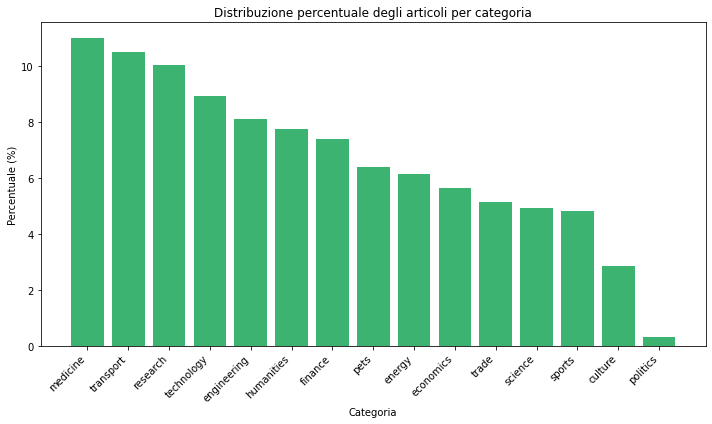

In [0]:
#Numero di articoli per categoria e grafico distribuzione
cat_counts = wikipedia_df.groupby("categoria").count().toPandas().sort_values(by="count", ascending=False)
cat_counts["percentage"] = cat_counts["count"]/cat_counts["count"].sum()*100

plt.figure(figsize=(10,6))
plt.bar(cat_counts["categoria"], cat_counts["percentage"], color='mediumseagreen')
plt.xticks(rotation=45, ha='right')
plt.title("Distribuzione percentuale degli articoli per categoria")
plt.xlabel("Categoria")
plt.ylabel("Percentuale (%)")
plt.tight_layout()
plt.show()

Possiamo osservare che in particolare le categorie **culture** e **politics** sono sottorappresentante, le più presenti con una percentuale di circa il 10% sono **medicine**, **transport** e **research**.

## 3.2 - Numero medio di parole per categoria

In [0]:
#Numero medio di parole per categoria
wikipedia_df.select("categoria", length("documents").alias("length"))\
  .groupBy("categoria")\
  .agg(round(avg("length")).alias("avg_length"), count("*").alias("num_articles"))\
  .orderBy("avg_length",ascending=False).show()

+-----------+----------+------------+
|  categoria|avg_length|num_articles|
+-----------+----------+------------+
|   politics|   13212.0|         243|
|    finance|   10055.0|        5582|
|    science|    7282.0|        3724|
| humanities|    6750.0|        5854|
|  economics|    5882.0|        4263|
|      trade|    5877.0|        3873|
| technology|    5520.0|        6750|
|    culture|    5460.0|        2175|
|   medicine|    5021.0|        8311|
|engineering|    4810.0|        6133|
|     sports|    4590.0|        3640|
|   research|    4581.0|        7573|
|     energy|    3879.0|        4641|
|  transport|    2913.0|        7936|
|       pets|    2552.0|        4825|
+-----------+----------+------------+



## 3.3 - Articolo più lungo e più corto per categoria

In [0]:
#Articolo più lungo e più breve per categoria
w = Window.partitionBy("categoria").orderBy(length("documents").desc())

result_df = wikipedia_df.withColumn("rank", row_number().over(w)) \
    .filter(col("rank") == 1) \
    .select("categoria", "title", "documents")

print("-------TABELLA CON L'ARTICOLO PIù LUNGO PER OGNI CATEGORIA--------\n")
display(result_df)

w = Window.partitionBy("categoria").orderBy(length("documents").asc())

result_df = wikipedia_df.withColumn("rank", row_number().over(w)) \
    .filter(col("rank") == 1) \
    .select("categoria", "title", "documents")

print("-------TABELLA CON L'ARTICOLO PIù CORTO PER OGNI CATEGORIA--------\n")
display(result_df)

-------TABELLA CON L'ARTICOLO PIù LUNGO PER OGNI CATEGORIA--------



categoria title documents finance king julian this is a list of characters from the dreamworks animation franchise of madagascar films and the tv shows. concept and creation tom mcgrath explained in an interview that the intention of madagascar was not to take a political stance on whether "zoos are bad and the wild is better, or that the wild is bad," but to show "the most extreme 'fish out of water' story that (they) could do". mcgrath stated "the basic irony to the story is that, you think animals do belong in the wild, but if they're so accustomed to civility, they wouldn't know where food even came from," and the animals were meant to "love the zoo and to love where they are because they've got" 5,000 square feet (460 m2) "right off fifth avenue".mcgrath also described, during the research of madagascar, they "found these crazy, weird animals that were already cartoons in their own right." primary alex alex (born alakay) (voiced by ben stiller) is a male african lion. he is best friends with marty (voiced by chris rock). he is used to the life of comfort in the zoo but learns to adapt to the wild. he's smart, quick thinking and fast on his feet. he is a dancer by nature, often impressing others with his aerobatic feats. he does tend to be a little self-absorbed, often not seeing the problems of others above his own. alex enjoys his life at the zoo and has plenty of friends and is surprised when hearing marty's wish to leave and live in the wild (or run free in connecticut as stated in the movie). as a cub, alex was born on an african wildlife reserve, and was named alakay. he has brown and yellow fur, white whiskers, a black nose, a large, fluffy mane, and a long tufted tail. he was the only son of the alpha lion, zuba (voiced by bernie mac), and was constantly given lessons on hunting, though he displayed no interest in the activity. during one of the sessions, alex was captured by poachers, but the crate he was contained in fell into a river and eventually floated to new york. he is found by humans who renamed him alex and took him to the central park zoo. in madagascar, after marty, alex's best friend, leaves in an effort to take a train to the wild, alex, gloria the hippopotamus (voiced by jada pinkett smith), and melman the giraffe (voiced by david schwimmer) pursue him and are shot with tranquilizer darts by humans. the animal-rights activists pressure the zoo into releasing them back into the wild, but on the ship to the preserve, alex and his friends fall into the ocean. they wash ashore on madagascar, and, while marty is excited to be free, alex wishes to go home. he grows very hungry after days of being unable to eat, not realizing that steak is animal flesh. hunger drives alex into a crazed state, and after almost killing marty in hunger, in a moment of lucidity, he goes into self-imposed exile, barricading himself in fossa territory. marty pursues him, unwilling to leave his friend, but is attacked by the fossa, the native predators of madagascar. alex works to defend marty and is later given sushi by the penguins to satiate his hunger. in madagascar: escape 2 africa, alex encounters his parents, zuba and florrie (sherri shepherd), who are overjoyed to see their son and he becomes co-alpha lion alongside his father. zuba assumes alex is strong after hearing he is the "king" of new york and arranges a rite of passage into the pride. makunga (alec baldwin), zuba's rival, persuades alex to challenge teentsi during the alex's rite of passage. teentsi was revealed to be a bulky, strong lion and alex is quickly defeated by him. to keep from banishing alex, zuba transfers his control to makunga, and in turn, he, florrie, and alex are banished. zuba soon grows unaccepting of alex after realizing he is not a fierce warrior. the next day, the watering hole is shown to be dried up and alex leaves with marty to find out the cause. they leave the safety of the reserve, prompting zuba to follow alex and bring him back. alex

-------TABELLA CON L'ARTICOLO PIù CORTO PER OGNI CATEGORIA--------



categoria,title,documents
finance,companies listed on the new york stock exchange,== t ==
medicine,hospital pirovano,"hospital pirovano is a hospital in buenos aires, argentina. == references =="
research,mark moss,mark b. moss is an american neurobiologist currently the waterhouse professor at boston university. == references ==
technology,wikipedia:wikiproject council/proposals/android,wikipedia:wikiproject android
energy,n-ergie,n-ergie is an energy company with headquarters in nuremberg.
politics,electoral history of pauline hanson,electoral history of pauline hanson. australian senate elections === 2022 ===
transport,"international bridges in laredo, texas",== road bridges == proposed rail bridges === proposed ===
culture,judenbüchel,"judenbüchel is a jewish cemetery in cologne, germany. == references =="
science,curtiss l,the curtiss l was an 80 hp (60 kw) water-cooled v-8 aero-engine. == references ==
humanities,marius vazeilles,marius vazeilles (1881–1973) was a french archaeologist.


## 3.4 - WordCloud per ogni categoria

In [0]:
#Funzione per pultire il testo prima di fare le cloud of wor
stop_words = set(stopwords.words('english'))  

def clean_text(text):
    # Minuscole
    text = text.lower()
    # Rimuovi punteggiatura e caratteri speciali, tieni solo lettere e spazi
    text = re.sub(r'[^a-z\s]', ' ', text)
    # Rimuovi stopwords
    words = text.split()
    words = [w for w in words if w not in stop_words]
    # Ricostruisci stringa pulita
    return ' '.join(words)


Categoria 'culture' - lunghezza testo pulito: 9497784


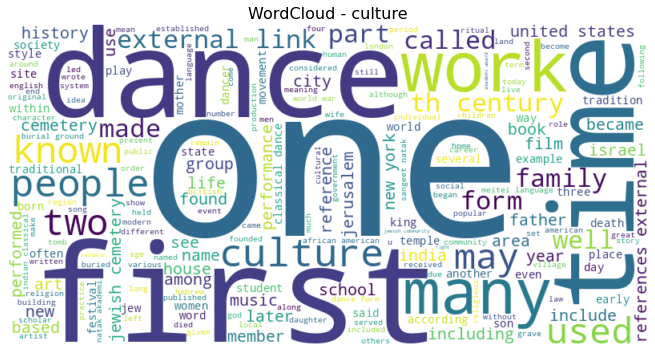

Categoria 'economics' - lunghezza testo pulito: 20001230


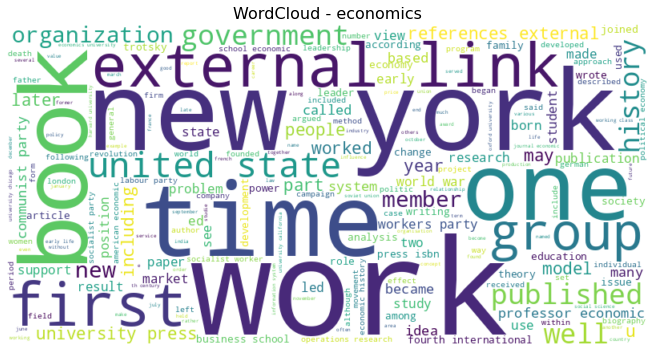

Categoria 'energy' - lunghezza testo pulito: 15201313


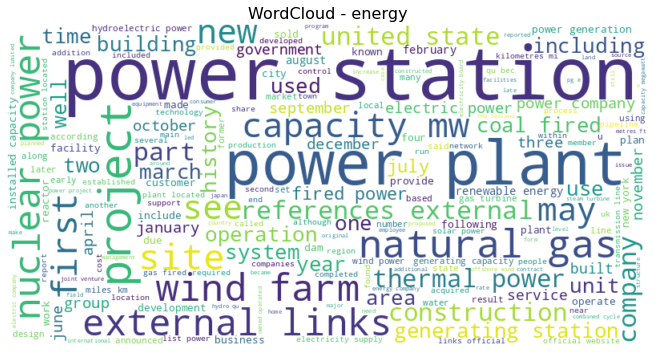

Categoria 'engineering' - lunghezza testo pulito: 23620799


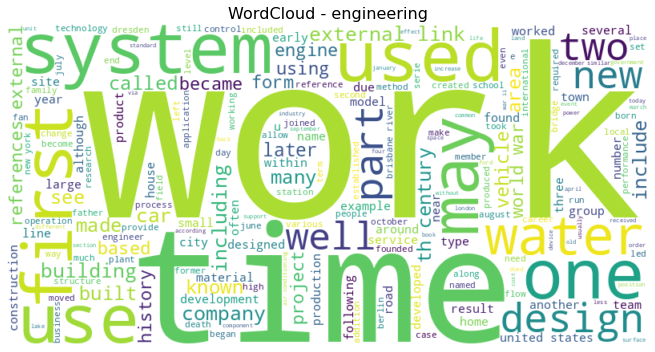

Categoria 'finance' - lunghezza testo pulito: 42901583


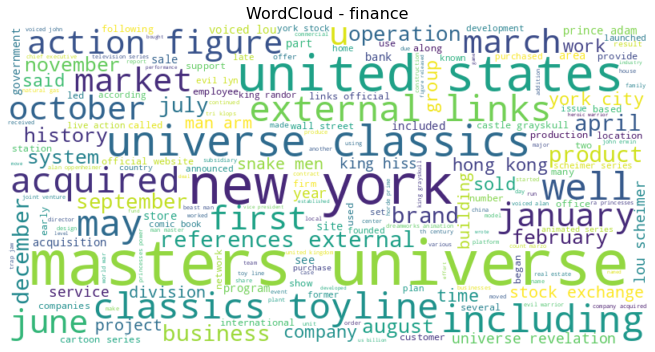

Categoria 'humanities' - lunghezza testo pulito: 29960717


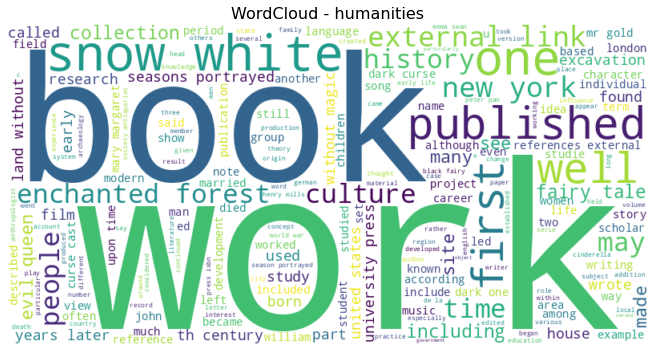

Categoria 'medicine' - lunghezza testo pulito: 34168055


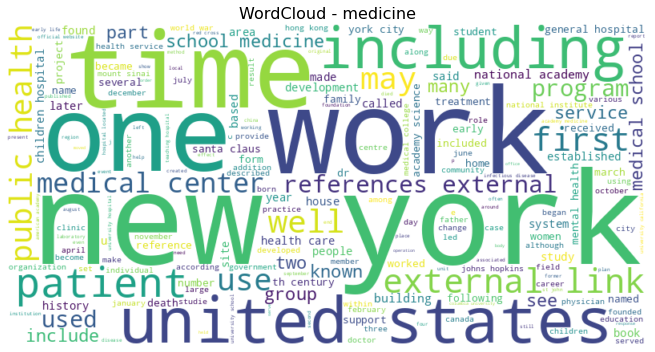

Categoria 'pets' - lunghezza testo pulito: 10221505


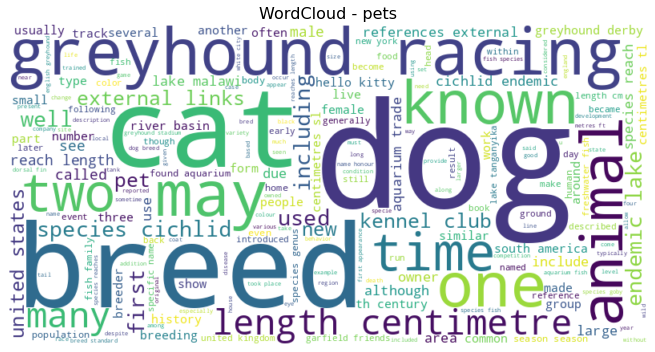

Categoria 'politics' - lunghezza testo pulito: 2546010


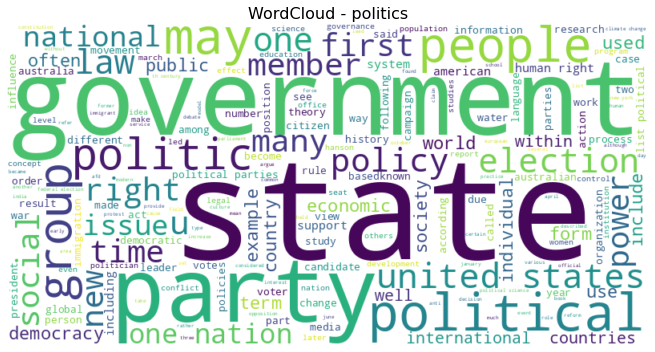

Categoria 'research' - lunghezza testo pulito: 28793870


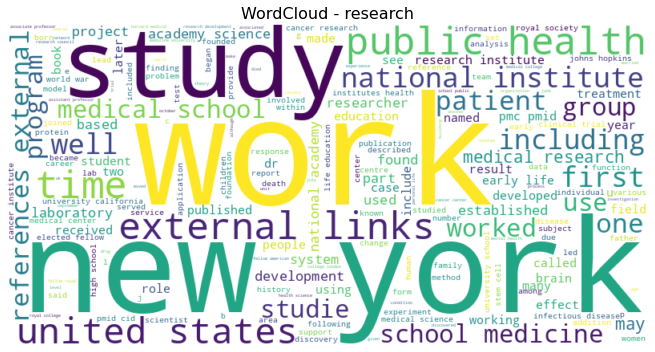

Categoria 'science' - lunghezza testo pulito: 20904091


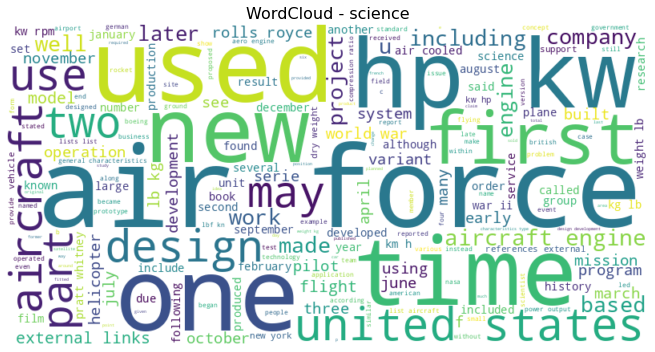

Categoria 'sports' - lunghezza testo pulito: 13099821


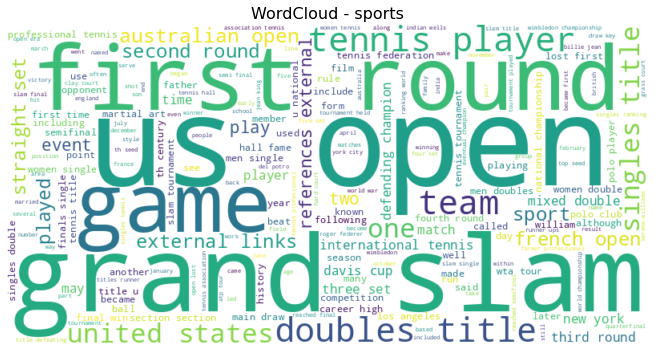

Categoria 'technology' - lunghezza testo pulito: 30032551


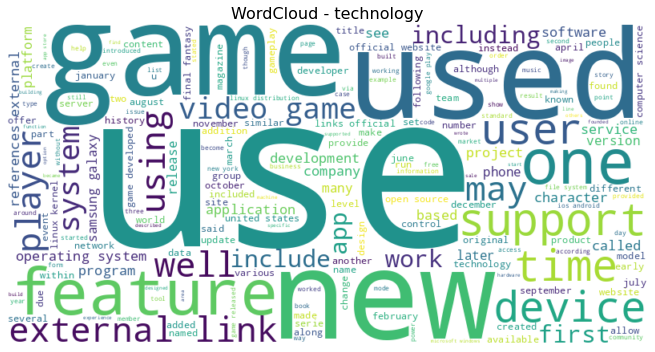

Categoria 'trade' - lunghezza testo pulito: 18117232


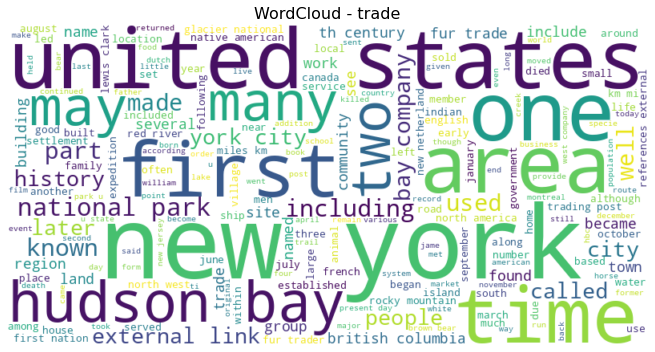

Categoria 'transport' - lunghezza testo pulito: 19117327


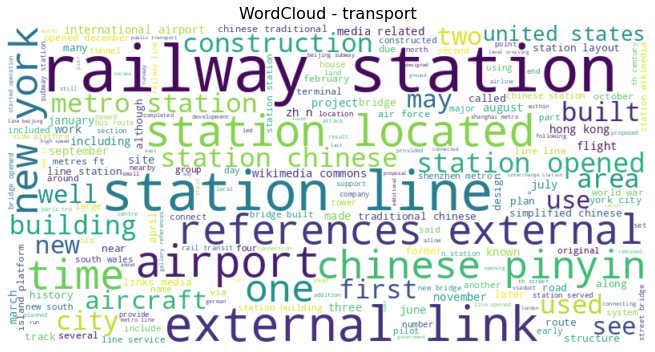

In [0]:
sum_doc_by_category = wikipedia_df.select("categoria", "summary", "documents").toPandas()

for cat in categorie:
    texts = sum_doc_by_category[sum_doc_by_category['categoria'] == cat]
    combined = texts['summary'].fillna('') + " " + texts['documents'].fillna('')
    cleaned_text = " ".join(clean_text(t) for t in combined if t)
    if not cleaned_text.strip():
        print(f"Categoria '{cat}' ha testo vuoto dopo pulizia, salto")
        continue
    print(f"Categoria '{cat}' - lunghezza testo pulito: {len(cleaned_text)}")
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud - {cat}", fontsize=16)
    plt.tight_layout()
    plt.show()


# 4- Sviluppo Classificatore Automatico

Confronteremo due modelli: regressione logistica e una random forest. Le features saranno estratte dalla concatenazione delle colonne *summary* e *documents*. Per la valutazione dei modelli osserveremo sia l'accuracy che l'F1-score.

In [0]:
# Creazione colonna combinata 'text' (summary + documents)
wikipedia_df = wikipedia_df.withColumn("text", concat_ws(" ", col("summary"), col("documents")))

# Split del dataset originale (wikipedia_df) in train e test
(train_df, test_df) = wikipedia_df.randomSplit([0.8, 0.2], seed=42)

# Definizione degli step della pipeline
tokenizer = RegexTokenizer(inputCol="text", outputCol="tokens", pattern="\\W")
remover = StopWordsRemover(inputCol="tokens", outputCol="clean_tokens")
indexer = StringIndexer(inputCol="categoria", outputCol="label")
hashing_tf = HashingTF(inputCol="clean_tokens", outputCol="rawFeatures", numFeatures=10000)
idf = IDF(inputCol="rawFeatures", outputCol="features")

# Modelli
lr = LogisticRegression(maxIter=20, regParam=0.1)
rf = RandomForestClassifier(numTrees=100)

# Pipeline Logistic Regression
pipeline_lr = Pipeline(stages=[tokenizer, remover, indexer, hashing_tf, idf, lr])
model_lr = pipeline_lr.fit(train_df)
pred_lr = model_lr.transform(test_df)

# Pipeline Random Forest
pipeline_rf = Pipeline(stages=[tokenizer, remover, indexer, hashing_tf, idf, rf])
model_rf = pipeline_rf.fit(train_df)
pred_rf = model_rf.transform(test_df)


F1 Logistic Regression: 0.8358471611790727
Accuracy Logistic Regression: 0.8365748244192328
F1 Random Forest: 0.5104133503368681
Accuracy Random Forest: 0.5307266342517558


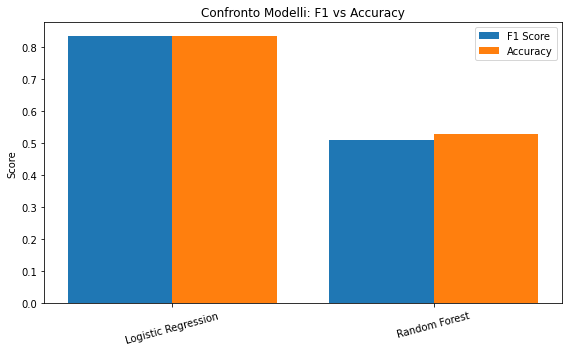

In [0]:
f1_evaluator = MulticlassClassificationEvaluator(metricName="f1")
acc_evaluator = MulticlassClassificationEvaluator(metricName="accuracy")

f1_lr = f1_evaluator.evaluate(pred_lr)
f1_rf = f1_evaluator.evaluate(pred_rf)
acc_lr = acc_evaluator.evaluate(pred_lr)
acc_rf = acc_evaluator.evaluate(pred_rf)

print("F1 Logistic Regression:", f1_lr)
print("Accuracy Logistic Regression:", acc_lr)
print("F1 Random Forest:", f1_rf)
print("Accuracy Random Forest:", acc_rf)

labels_plot = ["Logistic Regression", "Random Forest"]
f1_scores = [f1_lr, f1_rf]
acc_scores = [acc_lr, acc_rf]

x = range(len(labels_plot))

plt.figure(figsize=(8, 5))
plt.bar(x, f1_scores, width=0.4, label='F1 Score', align='center')
plt.bar([i + 0.4 for i in x], acc_scores, width=0.4, label='Accuracy', align='center')
plt.xticks([i + 0.2 for i in x], labels_plot, rotation=15)
plt.ylabel("Score")
plt.title("Confronto Modelli: F1 vs Accuracy")
plt.legend()
plt.tight_layout()
plt.show()

Osserviamo che con la logistic regression si ottiene già un buon risultato, vediamo se eseguendo l'ottimizzazione dei parametri riusciamo a migliorare le metriche.

Il finetuning lo faremo su un campione del 10% del dataset di training, questo per limiti computazionali della versione community di databricks. Questa è, però, anche una prassi comune dovuta alla dimensione dei dataset tipici dei bigdata.

Il fit su tutto il dataset lo faremo solo per il modello che mostra le migliori performance, per un problema legato alla gestione della memoria di databricks.

## 4.1 - Fine tuning iperparametri dei modelli di ML

In [0]:
sample_df = train_df.sample(withReplacement=False, fraction=0.1, seed=42)
pipeline_base = [tokenizer, remover, indexer, hashing_tf, idf]
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")

In [0]:
param_grid_lr = [
    {"regParam": 0.01, "elasticNetParam": 0.0},
    {"regParam": 0.1,  "elasticNetParam": 0.0},
    {"regParam": 0.1,  "elasticNetParam": 0.5},
    {"regParam": 1.0,  "elasticNetParam": 1.0}
]

best_f1_lr = 0
best_model_lr = None
best_params_lr = None

for params in param_grid_lr:
    print(f"🧪 Testando LR con: regParam={params['regParam']} - elasticNetParam={params['elasticNetParam']}")
    
    lr = LogisticRegression(regParam=params["regParam"], elasticNetParam=params["elasticNetParam"])
    pipeline = Pipeline(stages=pipeline_base + [lr])
    
    model = pipeline.fit(sample_df)
    predictions = model.transform(sample_df)
    
    f1 = evaluator.evaluate(predictions)
    print(f"🎯 F1 ottenuto: {f1}")
    
    if f1 > best_f1_lr:
        best_f1_lr = f1
        best_model_lr = model
        best_params_lr = params



🧪 Testando LR con: regParam=0.01 - elasticNetParam=0.0
🎯 F1 ottenuto: 0.9981873095280711
🧪 Testando LR con: regParam=0.1 - elasticNetParam=0.0
🎯 F1 ottenuto: 0.9917652804256811
🧪 Testando LR con: regParam=0.1 - elasticNetParam=0.5
🎯 F1 ottenuto: 0.555741401794008
🧪 Testando LR con: regParam=1.0 - elasticNetParam=1.0
🎯 F1 ottenuto: 0.019295115471523905


In [0]:
param_grid_rf = [
    {"numTrees": 50, "maxDepth": 10},
    {"numTrees": 100, "maxDepth": 10},
    {"numTrees": 100, "maxDepth": 5}
]

best_f1_rf = 0
best_model_rf = None
best_params_rf = None

for params in param_grid_rf:
    print(f"🧪 Testando RF con: numTrees={params['numTrees']} - maxDepth={params['maxDepth']}")
    
    rf = RandomForestClassifier(numTrees=params["numTrees"], maxDepth=params["maxDepth"])
    pipeline = Pipeline(stages=pipeline_base + [rf])
    
    model = pipeline.fit(sample_df)
    predictions = model.transform(sample_df)
    
    f1 = evaluator.evaluate(predictions)
    print(f"🎯 F1 ottenuto: {f1}")
    
    if f1 > best_f1_rf:
        best_f1_rf = f1
        best_model_rf = model
        best_params_rf = params



🧪 Testando RF con: numTrees=50 - maxDepth=10
🎯 F1 ottenuto: 0.7870700092432269
🧪 Testando RF con: numTrees=100 - maxDepth=10
🎯 F1 ottenuto: 0.8039605484639747
🧪 Testando RF con: numTrees=100 - maxDepth=5
🎯 F1 ottenuto: 0.5989558023552942


Possiamo osserevare che le migliori metriche le otteniamo per la regressione logistica con i seguenti parametri: regParam=0.01 - elasticNetParam=0.0

## 4.2 - Fit del modello con le migliori performance

In [0]:
print("🏆 Migliori parametri Logistic Regression:", best_params_lr)

final_lr = LogisticRegression(
    regParam=best_params_lr["regParam"],
    elasticNetParam=best_params_lr["elasticNetParam"]
)
pipeline_final_lr = Pipeline(stages=pipeline_base + [final_lr])
final_model_lr = pipeline_final_lr.fit(train_df)
predictions_lr = final_model_lr.transform(test_df)

f1_lr = evaluator.evaluate(predictions_lr)
accuracy_lr = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy").evaluate(predictions_lr)

print(f"✅ Logistic Regression finale - F1: {f1_lr:.4f} - Accuracy: {accuracy_lr:.4f}")

🏆 Migliori parametri Logistic Regression: {'regParam': 0.01, 'elasticNetParam': 0.0}
✅ Logistic Regression finale - F1: 0.8505 - Accuracy: 0.8501


Le metriche sono un po' peggiorat

## 4.3 - Analisi del modello

Creazione della matrice di confusione per una analisi più puntuale.

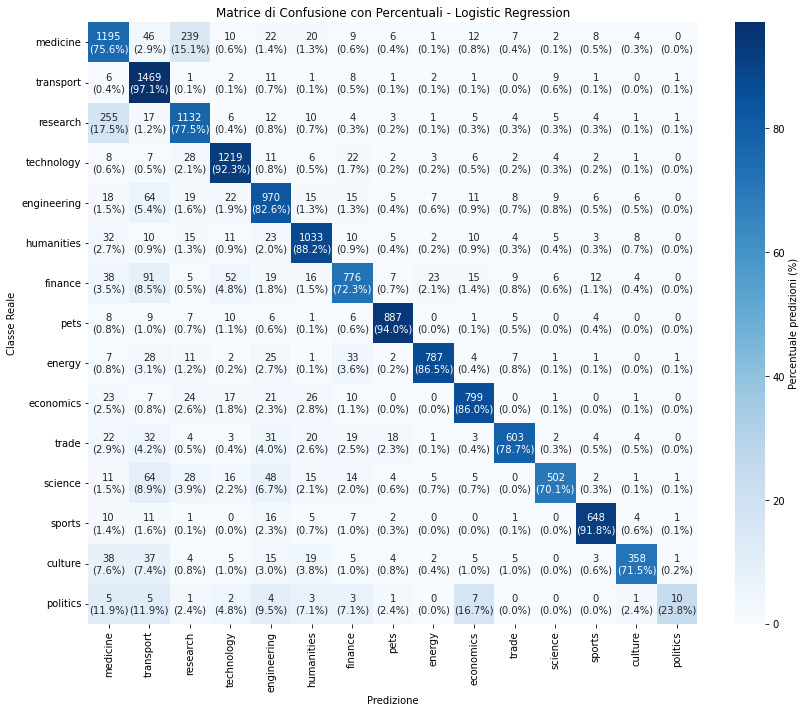

In [0]:
# 1. Crea matrice di confusione Spark
conf_df = pred_lr.groupBy("label", "prediction").count()
conf_df = conf_df.groupBy("label").pivot("prediction").sum("count").fillna(0)

# 2. Decodifica label in stringa
labels = final_model_lr.stages[2].labels  # StringIndexerModel
decode_udf = udf(lambda i: labels[int(i)], StringType())
conf_df = conf_df.withColumn("categoria", decode_udf(col("label")))

# 3. Converti in pandas
conf_pd = conf_df.toPandas()

# 4. Ordina le righe secondo ordine delle label originali
conf_pd["label_index"] = conf_pd["categoria"].map(lambda x: labels.index(x))
conf_pd = conf_pd.sort_values("label_index").drop(columns=["label_index"])

# 5. Sposta 'categoria' come indice
conf_pd.set_index("categoria", inplace=True)

# 6. Rimuove colonna 'label' se presente
if "label" in conf_pd.columns:
    conf_pd.drop(columns=["label"], inplace=True)

# 7. Rinomina colonne da numeri a etichette
new_columns = []
for col in conf_pd.columns:
    try:
        idx = int(float(col))
        new_columns.append(labels[idx])
    except:
        new_columns.append(col)
conf_pd.columns = new_columns

# 8. Riordina le colonne come le righe (categorie vere → stesse predette)
conf_pd = conf_pd[conf_pd.index]

# 9. Calcola percentuali riga
conf_percent = conf_pd.div(conf_pd.sum(axis=1), axis=0).multiply(100).round(1)

# 10. Annota con valore assoluto + percentuale
annot = conf_pd.astype(int).astype(str) + "\n(" + conf_percent.astype(str) + "%)"

# 11. Visualizza con seaborn heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    conf_percent,
    annot=annot,
    fmt="",
    cmap="Blues",
    xticklabels=conf_pd.columns,
    yticklabels=conf_pd.index,
    cbar_kws={'label': 'Percentuale predizioni (%)'}
)
plt.xlabel("Predizione")
plt.ylabel("Classe Reale")
plt.title("Matrice di Confusione con Percentuali - Logistic Regression")
plt.tight_layout()
plt.show()


Possiamo osservare che il modello ha buone performance quasi in tutte le categorie. 

La categoria più problematica è **politics**, ma questa è anche quella meno rappresentata nel dataset con circa il 2%, in fase di training probabilmente è stata semplicemente ignorata. Si potrebbero migliorare le performance facendo un campionamento del dataset che vada a ridurre lo sbilanciamento tra le classi.

Per quanto riguarda le altre categoria, possiamo notare che i mismatch più importanti sono per categorie affini, riporto alcuni esempi:

- **medicine** -> **research** 15,1%
- **research** -> **medicine** 17,5%
- **technology** -> **research** 2,1%
- **engineering** -> **transport** 5,4%
- **humanities** -> **medicine** 2,7%
- **finance** -> **transport** 8,5%
ecc...

Mi auguro che questa analisi abbia fornito gli insignt richiesti dalla compagnia.